#Problem Statement and Objective

Banks conduct marketing campaigns to promote term deposit products among their customers.
However, contacting every customer is costly and inefficient, as not all customers are interested in subscribing to a term deposit.

The objective of this task is to build a machine learning classification model that can predict whether a bank customer will subscribe to a term deposit based on demographic, financial, and campaign-related information.
This prediction helps the bank optimize marketing efforts, reduce operational costs, and improve campaign success rates.



#Dataset Description

The dataset used for this task is the Bank Marketing Dataset obtained from the UCI Machine Learning Repository.
It contains data collected from direct marketing campaigns of a Portuguese banking institution.

Each row in the dataset represents a single customer, and the columns include:

Customer demographic information (e.g., age, job, marital status)

Financial details (e.g., balance, loan, housing)

Campaign-related attributes (e.g., number of calls, previous contacts)

A target variable y, which indicates whether the customer subscribed to a term deposit (yes or no)

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.metrics import confusion_matrix,classification_report,f1_score,roc_auc_score,roc_curve

import shap

import warnings
warnings.filterwarnings('ignore')
#

# =========================================
# 2. LOAD DATASET
# =========================================

In [ ]:
import pandas as pd

df = pd.read_csv("/content/bank-additional-full.csv", sep=';')
df.head()


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [ ]:
df.shape

(41188, 21)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [ ]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [ ]:
df.isnull().sum()

,0
age,0
job,0
marital,0
education,0
default,0
housing,0
loan,0
contact,0
month,0
day_of_week,0


In [ ]:
df.duplicated().sum()

np.int64(12)

In [ ]:
df.drop_duplicates(inplace=True)

# =========================================
# 3. EXPLORATORY DATA ANALYSIS (EDA)
# =========================================

# Target variable distribution

In [ ]:
df['y'].value_counts()

,count
y,
no,36537
yes,4639


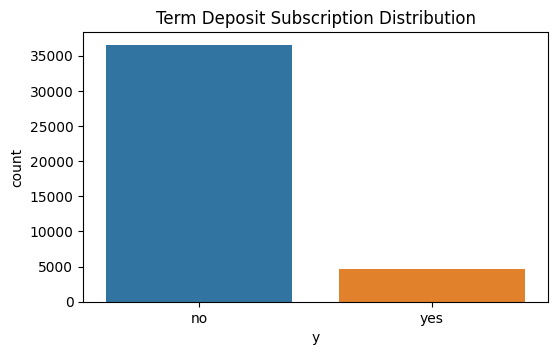

In [ ]:
# Visualize target variable
plt.figure(figsize=(6, 3.5))
sns.countplot(x='y', data=df ,hue ='y')
plt.title("Term Deposit Subscription Distribution")
plt.show()


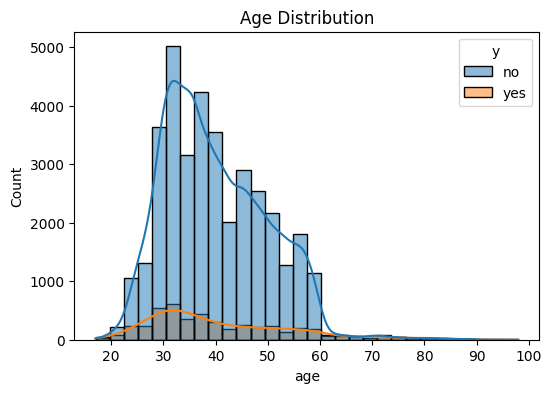

In [ ]:
# Age distribution
plt.figure(figsize=(6,4))
sns.histplot(x="age", bins=30, kde=True,hue = "y",data=df)
plt.title("Age Distribution")
plt.show()


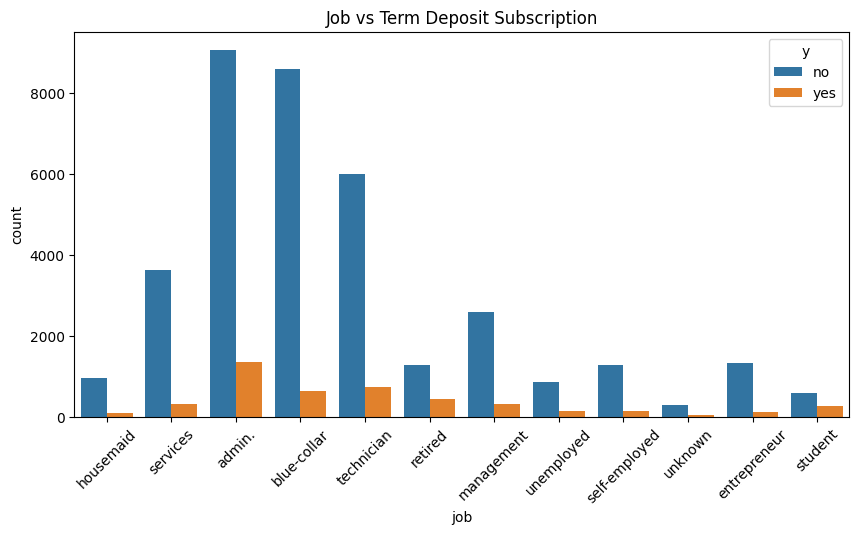

In [ ]:
# Job vs Subscription
plt.figure(figsize=(10,5))
sns.countplot(x='job', hue='y', data=df)
plt.xticks(rotation=45)
plt.title("Job vs Term Deposit Subscription")
plt.show()


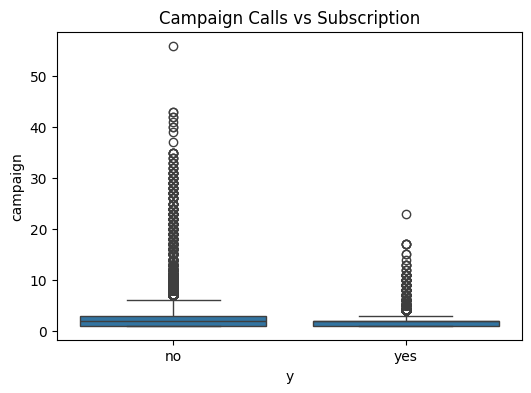

In [ ]:
# Campaign calls vs subscription
plt.figure(figsize=(6,4))
sns.boxplot(x='y', y='campaign', data=df)
plt.title("Campaign Calls vs Subscription")
plt.show()


# =========================================
# 4. ENCODING CATEGORICAL FEATURES
# =========================================

In [ ]:
le = LabelEncoder()

for col in df.select_dtypes(include='object').columns:
    df[col] = le.fit_transform(df[col])



In [ ]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,3,1,0,0,0,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
1,57,7,1,3,1,0,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
2,37,7,1,3,0,2,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
3,40,0,1,1,0,0,0,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0
4,56,7,1,3,0,0,2,1,6,1,...,1,999,0,1,1.1,93.994,-36.4,4.857,5191.0,0


# =========================================
# 5. FEATURE & TARGET SPLIT
# =========================================

In [ ]:
X = df.drop('y', axis=1)
y = df['y']


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2 ,random_state=42 ,stratify=y)

# =========================================
# 7. MODEL TRAINING
# =========================================


In [ ]:
# Logistic Regression
lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(x_train, y_train)

# Random Forest
rf_model = RandomForestClassifier(
    n_estimators=200,
    random_state=42
)
rf_model.fit(x_train, y_train)


RandomForestClassifier(n_estimators=200, random_state=42)

# =========================================
# 8. MODEL EVALUATION - RANDOM FOREST
# =========================================


In [ ]:

y_pred = rf_model.predict(x_test)
y_prob = rf_model.predict_proba(x_test)[:, 1]

# Classification Report
print("Classification Report:\n")
print(classification_report(y_test, y_pred))


Classification Report:

              precision    recall  f1-score   support

           0       0.94      0.96      0.95      7308
           1       0.64      0.53      0.58       928

    accuracy                           0.91      8236
   macro avg       0.79      0.75      0.77      8236
weighted avg       0.91      0.91      0.91      8236



In [ ]:

y_pred = lr_model.predict(x_test)
y_prob = lr_model.predict_proba(x_test)[:, 1]

# Classification Report
print("Classification Report:\n")
print(classification_report(y_test, y_pred))


Classification Report:

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      7308
           1       0.67      0.41      0.51       928

    accuracy                           0.91      8236
   macro avg       0.80      0.69      0.73      8236
weighted avg       0.90      0.91      0.90      8236



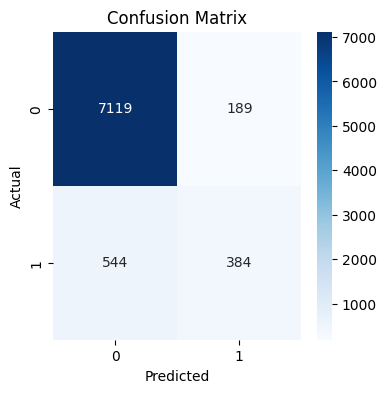

In [ ]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(4,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


In [ ]:
# F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)


F1 Score: 0.5116588940706196


In [ ]:
# ROC-AUC Score
roc_auc = roc_auc_score(y_test, y_prob)
print("ROC-AUC Score:", roc_auc)


ROC-AUC Score: 0.9315477665005757


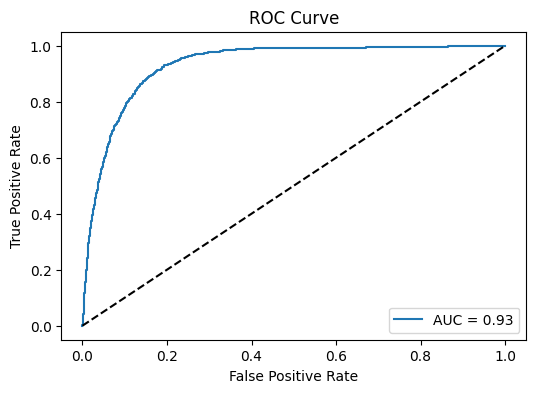

In [ ]:
# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
plt.plot([0,1], [0,1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()


# =========================================
# 9. EXPLAINABLE AI USING LIME
# =========================================


In [ ]:
!pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=8fe3499fa47dd28a321a2ca8764a2457262954d331bd7ef659d0b5797c243f7a
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
import numpy as np
from lime.lime_tabular import LimeTabularExplainer


In [ ]:
explainer = LimeTabularExplainer(
    training_data = x_train.values,
    feature_names = x_train.columns,
    class_names = ['No', 'Yes'],
    mode = 'classification',
    discretize_continuous = True
)


# =========================================
# 10. EXPLAIN 5 INDIVIDUAL PREDICTIONS
# =========================================


In [ ]:
for i in range(5):
    exp = explainer.explain_instance(
        x_test.iloc[i].values,       # one sample
        rf_model.predict_proba,      # model
        num_features = 5             # top 5 features
    )

    print(f"\n🔹 Explanation for sample {i+1}")
    print("Prediction:", rf_model.predict(x_test.iloc[[i]])[0])
    print("Probability:", rf_model.predict_proba(x_test.iloc[[i]]))
    exp.show_in_notebook(show_table=True)



🔹 Explanation for sample 1
Prediction: 0
Probability: [[1. 0.]]



🔹 Explanation for sample 2
Prediction: 1
Probability: [[0.085 0.915]]



🔹 Explanation for sample 3
Prediction: 0
Probability: [[0.975 0.025]]



🔹 Explanation for sample 4
Prediction: 0
Probability: [[0.855 0.145]]



🔹 Explanation for sample 5
Prediction: 0
Probability: [[1. 0.]]


#Final Conclusion and Insights

In this task, machine learning models were developed to predict whether a bank customer would subscribe to a term deposit based on marketing campaign data.
Among the trained models, Random Forest achieved better performance compared to Logistic Regression by effectively capturing complex relationships in the data.

Key factors influencing customer subscription included account balance, number of campaign calls, and age. Customers with higher balances and fewer campaign contacts showed a higher likelihood of subscribing to a term deposit.

To ensure model transparency, LIME (Local Interpretable Model-agnostic Explanations) was used to explain individual predictions. LIME provided local explanations by highlighting the most influential features for each prediction, helping to understand why the model classified a customer as a potential subscriber or non-subscriber.

Overall, this approach enables banks to optimize marketing strategies, reduce unnecessary calls, and focus efforts on customers with a higher probability of conversion.